# Imports

In [41]:
%pip install segmentation_models_pytorch scikit-image pytorch-msssim

Note: you may need to restart the kernel to use updated packages.


In [42]:
import os
import gc
import copy
import pickle
import random

import cv2
import numpy as np

import torch
import segmentation_models_pytorch as smp
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split
from pytorch_msssim import SSIM
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

import matplotlib.pyplot as plt
from tqdm import tqdm

# Data Loading and Exploration

In [43]:
DATA_DIR = "/kaggle/input/image-colorization"

L_path = os.path.join(DATA_DIR, "l/gray_scale.npy")
L_channel = np.load(L_path)

ab_channels_list = []
ab_dir = os.path.join(DATA_DIR, "ab/ab")
ab_files = sorted([f for f in os.listdir(ab_dir) if f.startswith("ab") and f.endswith(".npy")])
for f_name in tqdm(ab_files, desc="Loading ab files"):
    file_path = os.path.join(ab_dir, f_name)
    ab_chunk = np.load(file_path)
    ab_channels_list.append(ab_chunk)
ab_channels = np.concatenate(ab_channels_list, axis=0)

print(f"L.shape: {L_channel.shape}")
print(f"ab.shape: {ab_channels.shape}")
print(f"L.dtype: {L_channel.dtype}")
print(f"ab.dtype: {ab_channels.dtype}")
print(f"L values range: {L_channel.min()}-{L_channel.max()}")
print(f"ab values range: {ab_channels.min()}-{ab_channels.max()}")

Loading ab files: 100%|██████████| 3/3 [00:00<00:00,  3.84it/s]


L.shape: (25000, 224, 224)
ab.shape: (25000, 224, 224, 2)
L.dtype: uint8
ab.dtype: uint8
L values range: 0-255
ab values range: 20-226


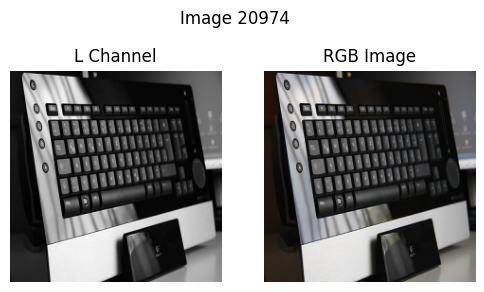

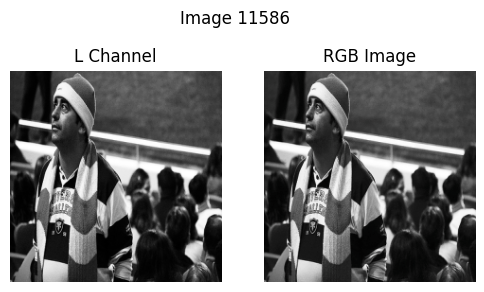

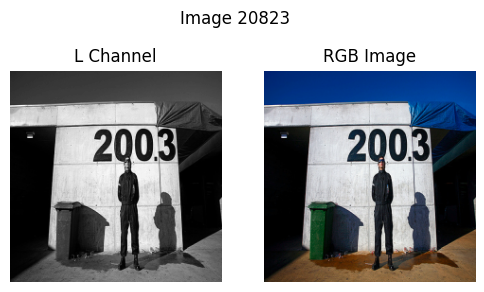

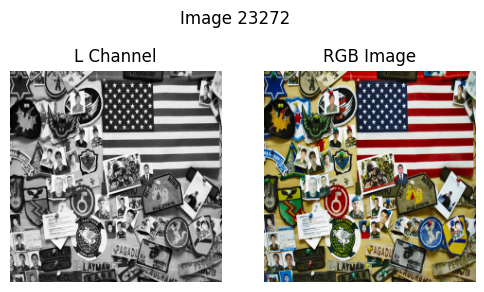

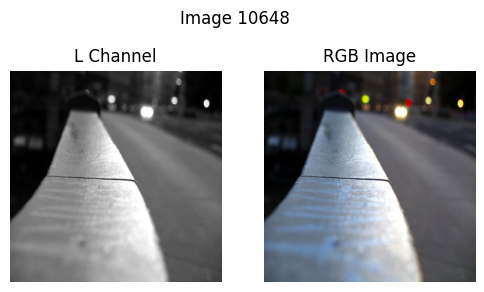

In [44]:
NUM_IMAGES_TO_VIEW = 5
for _ in range(NUM_IMAGES_TO_VIEW):
    idx = np.random.randint(0, len(L_channel))

    L = L_channel[idx]
    ab = ab_channels[idx]

    L = np.expand_dims(L, axis=2)

    Lab = np.concatenate((L, ab), axis=2).astype(np.uint8)
    img_rgb = cv2.cvtColor(Lab, cv2.COLOR_Lab2RGB)

    plt.figure(figsize=(6, 3))
    plt.suptitle(f"Image {idx}", y=1.05)
    plt.subplot(1, 2, 1)
    plt.title(f"L Channel")
    plt.axis("off")
    plt.imshow(L.squeeze(), cmap="gray")
    plt.subplot(1, 2, 2)
    plt.title(f"RGB Image")
    plt.axis("off")
    plt.imshow(img_rgb)
    plt.show()

# ML Pipeline

In [45]:
class ColorizationDataset(Dataset):
    def __init__(self, L_channel, ab_channel, split="train"):
        self.L_channel = L_channel
        self.ab_channel = ab_channel
        self.split = split
        # from torchvision documentation
        self.imagenet_mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
        self.imagenet_std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)

    def __len__(self):
        return len(self.L_channel)

    def __getitem__(self, idx):
        L = self.L_channel[idx]
        ab = self.ab_channel[idx]

        if self.split == "train":
            if random.random() > 0.5:
                L = cv2.flip(L, 1)
                ab = cv2.flip(ab, 1)

        L = np.expand_dims(L, axis=2)
        L_tensor = torch.from_numpy(L.copy()).permute(2, 0, 1).float()
        L_tensor = L_tensor / 255.0
        # repeat the single L channel
        # to imitate a 3-channel input the model was pre-trained on (ImageNet)
        L_tensor = L_tensor.repeat(3, 1, 1)
        # apply ImageNet normalization
        L_tensor = (L_tensor - self.imagenet_mean) / self.imagenet_std

        ab_tensor = torch.from_numpy(ab.copy()).permute(2, 0, 1).float()
        ab_tensor = (ab_tensor - 128.0) / 128.0

        return L_tensor, ab_tensor

In [46]:
L_train_val, L_test, ab_train_val, ab_test = train_test_split(
    L_channel,
    ab_channels,
    test_size=0.2,
    random_state=42
)

L_train, L_val, ab_train, ab_val = train_test_split(
    L_train_val,
    ab_train_val,
    test_size=0.25,
    random_state=42
)

print(f"Train set size: {len(L_train)} images")
print(f"Val set size: {len(L_val)} images")
print(f"Test set size: {len(L_test)} images")

Train set size: 15000 images
Val set size: 5000 images
Test set size: 5000 images


In [47]:
def train_model(model, train_loader, val_loader, loss_fn, optimizer, scheduler, num_epochs, device):
    best_model_weights = copy.deepcopy(model.state_dict())
    best_val_loss = float("inf")
    
    history = {"train_loss": [], "val_loss": []}

    for epoch in range(num_epochs):
        model.train()
        running_train_loss = 0.0
        train_loop = tqdm(train_loader, desc=f"[Train] Epoch {epoch+1}/{num_epochs}")
        
        for L_batch, ab_batch in train_loop:
            L_batch = L_batch.to(device)
            ab_batch = ab_batch.to(device)
            
            outputs = model(L_batch)
            loss = loss_fn(outputs, ab_batch)
            
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
            running_train_loss += loss.item()
            train_loop.set_postfix(loss=loss.item())

        avg_train_loss = running_train_loss / len(train_loader)
        history["train_loss"].append(avg_train_loss)

        model.eval()
        running_val_loss = 0.0
        val_loop = tqdm(val_loader, desc=f"[Val] Epoch {epoch+1}/{num_epochs}")

        with torch.no_grad():
            for L_batch, ab_batch in val_loop:
                L_batch = L_batch.to(device)
                ab_batch = ab_batch.to(device)

                outputs = model(L_batch)
                loss = loss_fn(outputs, ab_batch)

                running_val_loss += loss.item()
                val_loop.set_postfix(val_loss=loss.item())

        avg_val_loss = running_val_loss / len(val_loader)
        history["val_loss"].append(avg_val_loss)
        scheduler.step(avg_val_loss)

        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            best_model_weights = copy.deepcopy(model.state_dict())

    model.load_state_dict(best_model_weights)

    return model, history

In [55]:
train_dataset = ColorizationDataset(L_train, ab_train, split="train")
val_dataset = ColorizationDataset(L_val, ab_val, split="val")
test_dataset = ColorizationDataset(L_test, ab_test, split="test")

BATCH_SIZE = 64
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

In [49]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(device)


ssim_module = SSIM(data_range=2.0, size_average=True, channel=2)
loss_fn = lambda pred, target: 1 - ssim_module(pred, target)
LEARNING_RATE = 3e-4
NUM_EPOCHS = 10

cuda


In [56]:
BASELINE_MODEL_NAME = "mobilenet_v2"
MAIN_MODEL_NAME = "efficientnet-b2"
BASELINE_WEIGHTS_PATH = f"/kaggle/working/baseline_{BASELINE_MODEL_NAME}_best.pt"
BASELINE_HISTORY_PATH = f"/kaggle/working/baseline_{BASELINE_MODEL_NAME}_history.pkl"
MAIN_WEIGHTS_PATH = f"/kaggle/working/main_{MAIN_MODEL_NAME}_best.pt"
MAIN_HISTORY_PATH = f"/kaggle/working/main_{MAIN_MODEL_NAME}_history.pkl"

In [51]:
if not os.path.exists(BASELINE_WEIGHTS_PATH):
    baseline_model = smp.Unet(
        encoder_name=BASELINE_MODEL_NAME,
        encoder_weights="imagenet",
        in_channels=3,
        classes=2,
    ).to(device)

    optimizer_baseline = torch.optim.Adam(baseline_model.parameters(), lr=LEARNING_RATE)

    scheduler_baseline = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer_baseline,
        mode="min",
        factor=0.5,
        patience=2
    )

    baseline_model, baseline_history = train_model(
        model=baseline_model,
        train_loader=train_loader,
        val_loader=val_loader,
        loss_fn=loss_fn,
        optimizer=optimizer_baseline,
        scheduler=scheduler_baseline,
        num_epochs=NUM_EPOCHS,
        device=device
    )
    
    torch.save(baseline_model.state_dict(), BASELINE_WEIGHTS_PATH)
    print(f"Training complete. Best baseline model weights saved to {BASELINE_WEIGHTS_PATH}")

    with open(BASELINE_HISTORY_PATH, "wb") as f:
        pickle.dump(baseline_history, f)

    del baseline_model
    del optimizer_baseline
    del scheduler_baseline
    gc.collect()
    torch.cuda.empty_cache()
    print("Memory cleared")
else:
    if os.path.exists(BASELINE_HISTORY_PATH):
        print(f"Loading existing history from {BASELINE_HISTORY_PATH}")
        with open(BASELINE_HISTORY_PATH, "rb") as f:
            baseline_history = pickle.load(f)
    else:
        print("No baseline history file found. Plotting will be skipped.")
        baseline_history = None

config.json:   0%|          | 0.00/106 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/14.2M [00:00<?, ?B/s]

[Val] Epoch 10/10: 100%|██████████| 79/79 [00:10<00:00,  7.33it/s, val_loss=0.642]


Training complete. Best baseline model weights saved to /kaggle/working/baseline_mobilenet_v2_best.pt
Memory cleared


In [60]:
if not os.path.exists(MAIN_WEIGHTS_PATH):
    main_model = smp.Unet(
        encoder_name=MAIN_MODEL_NAME,
        encoder_weights="imagenet",
        in_channels=3,
        classes=2,
    ).to(device)

    optimizer_main = torch.optim.Adam(main_model.parameters(), lr=LEARNING_RATE)

    scheduler_main = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer_main,
        mode="min",
        factor=0.5,
        patience=2
    )

    main_model, main_history = train_model(
        model=main_model,
        train_loader=train_loader,
        val_loader=val_loader,
        loss_fn=loss_fn,
        optimizer=optimizer_main,
        scheduler=scheduler_main,
        num_epochs=NUM_EPOCHS,
        device=device
    )
    
    torch.save(main_model.state_dict(), MAIN_WEIGHTS_PATH)
    print(f"Training complete. Best main model weights saved to {MAIN_WEIGHTS_PATH}")

    with open(MAIN_HISTORY_PATH, "wb") as f:
        pickle.dump(main_history, f)

    del main_model
    del optimizer_main
    del scheduler_main
    gc.collect()
    torch.cuda.empty_cache()
    print("Memory cleared")
else:
    if os.path.exists(MAIN_HISTORY_PATH):
        print(f"Loading existing history from {MAIN_HISTORY_PATH}")
        with open(MAIN_HISTORY_PATH, "rb") as f:
            main_history = pickle.load(f)
    else:
        print("No main history file found. Plotting will be skipped.")
        main_history = None

[Val] Epoch 10/10: 100%|██████████| 79/79 [00:14<00:00,  5.56it/s, val_loss=0.609]


Training complete. Best main model weights saved to /kaggle/working/main_efficientnet-b2_best.pt
Memory cleared


In [61]:
def plot_loss_curves(baseline_history, main_history):    
    epochs = range(1, len(baseline_history["train_loss"]) + 1)
    
    plt.figure(figsize=(14, 6))
    
    plt.subplot(1, 2, 1)
    plt.plot(epochs, baseline_history["train_loss"], "bo-", label=f"Baseline ({BASELINE_MODEL_NAME}) Train Loss")
    plt.plot(epochs, main_history["train_loss"], "ro-", label=f"Main ({MAIN_MODEL_NAME}) Train Loss")
    plt.title("Training Loss")
    plt.xlabel("Epochs")
    plt.ylabel("L1 Loss")
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs, baseline_history["val_loss"], "bo-", label="Baseline ({BASELINE_MODEL_NAME}) Val Loss")
    plt.plot(epochs, main_history["val_loss"], "ro-", label="Main ({MAIN_MODEL_NAME}) Val Loss")
    plt.title("Validation Loss")
    plt.xlabel("Epochs")
    plt.ylabel("L1 Loss")
    plt.legend()
    
    plt.tight_layout()
    plt.show()

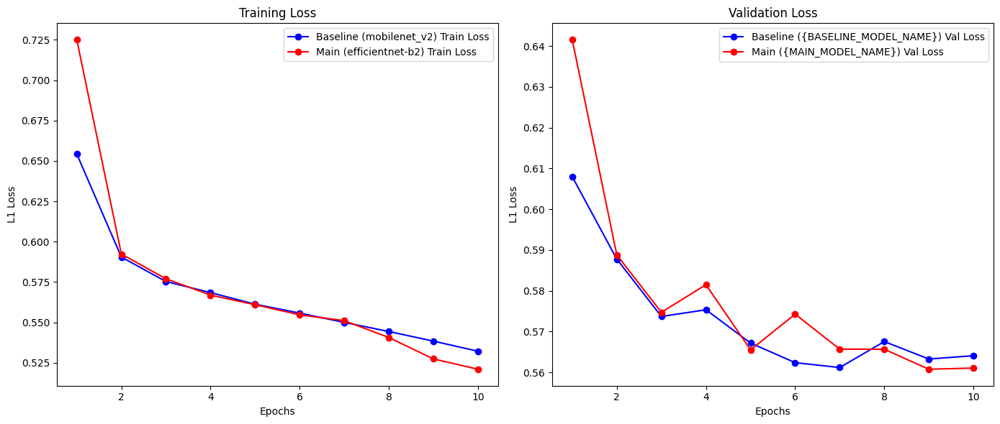

In [62]:
if baseline_history is not None and main_history is not None:
    plot_loss_curves(baseline_history, main_history)

# Metrics and Visualization

In [95]:
def visualize_results(model_baseline, model_main, loader, device, num_images=5):
    model_baseline.eval()
    model_baseline.to(device)
    model_main.eval()
    model_main.to(device)

    L_batch, ab_batch = next(iter(loader))
    L_batch = L_batch.to(device)

    with torch.no_grad():
        pred_ab_baseline = model_baseline(L_batch).cpu()
        pred_ab_main = model_main(L_batch).cpu()

    for i in range(min(num_images, L_batch.size(0))):
        L_single_channel = L_batch[i, 0:1, :, :]
        # denormalize == (L * std) + mean
        mean_0 = 0.485
        std_0 = 0.229
        gt_L = (((L_single_channel.cpu().permute(1, 2, 0) * std_0) + mean_0) * 255.0).numpy().astype(np.uint8)
        gt_ab = ((ab_batch[i].numpy().transpose(1, 2, 0) * 128.0) + 128.0).astype(np.uint8)
        gt_Lab = np.concatenate((gt_L, gt_ab), axis=2)
        gt_rgb = cv2.cvtColor(gt_Lab, cv2.COLOR_Lab2RGB)

        pred_ab_b = ((pred_ab_baseline[i].numpy().transpose(1, 2, 0) * 128.0) + 128.0).astype(np.uint8)
        pred_Lab_b = np.concatenate((gt_L, pred_ab_b), axis=2)
        pred_rgb_b = cv2.cvtColor(pred_Lab_b, cv2.COLOR_Lab2RGB)

        pred_ab_m = ((pred_ab_main[i].numpy().transpose(1, 2, 0) * 128.0) + 128.0).astype(np.uint8)
        pred_Lab_m = np.concatenate((gt_L, pred_ab_m), axis=2)
        pred_rgb_m = cv2.cvtColor(pred_Lab_m, cv2.COLOR_Lab2RGB)

        plt.figure(figsize=(20, 5))

        plt.subplot(1, 3, 1)
        plt.imshow(pred_rgb_b)
        plt.title(f"Baseline ({BASELINE_MODEL_NAME})")
        plt.axis("off")
        
        plt.subplot(1, 3, 2)
        plt.imshow(pred_rgb_m)
        plt.title(f"Main Model ({MAIN_MODEL_NAME})")
        plt.axis("off")
        
        plt.subplot(1, 3, 3)
        plt.imshow(gt_rgb)
        plt.title("Ground Truth")
        plt.axis("off")
        
        plt.show()

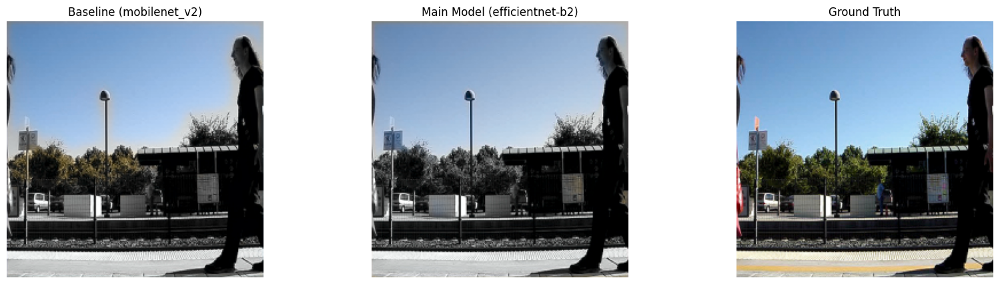

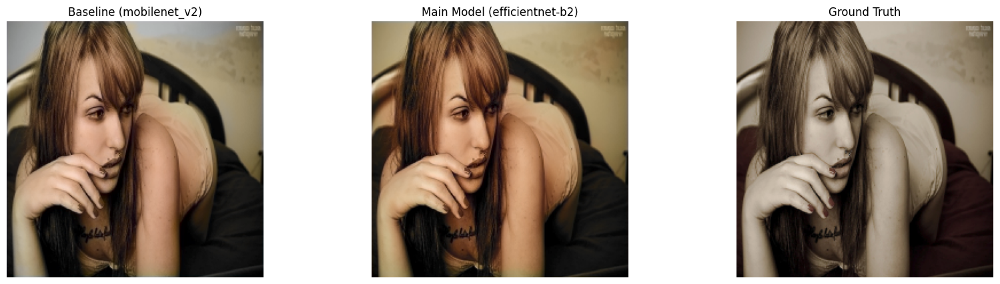

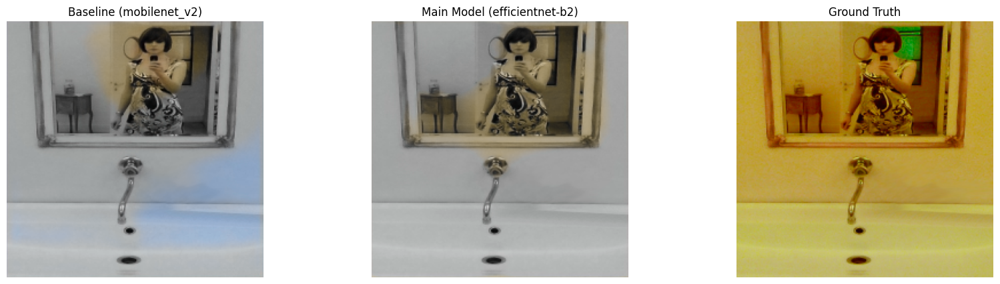

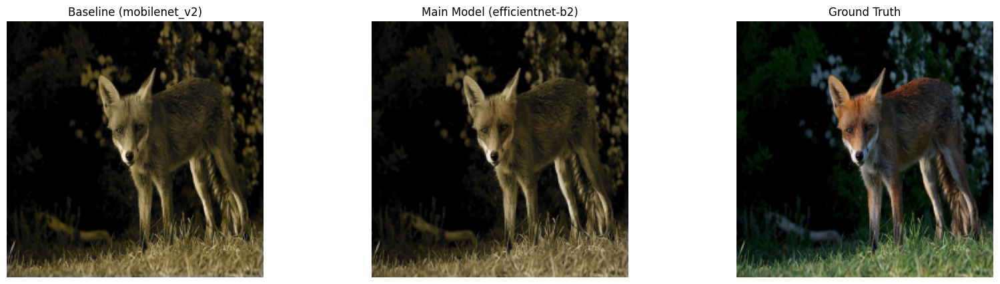

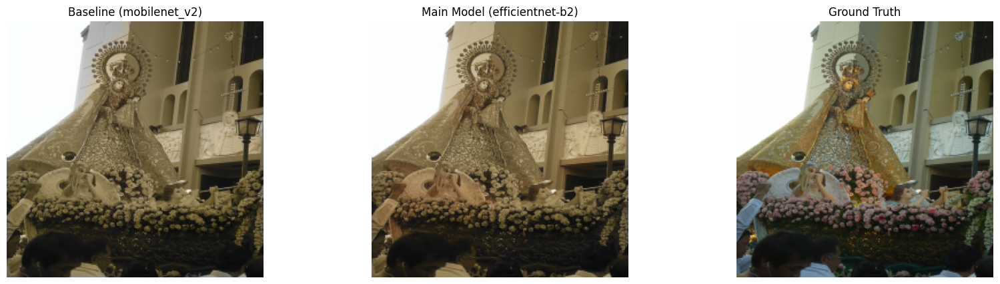

...

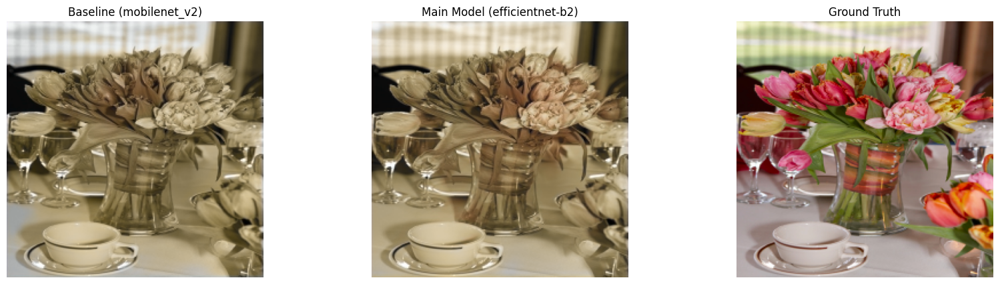

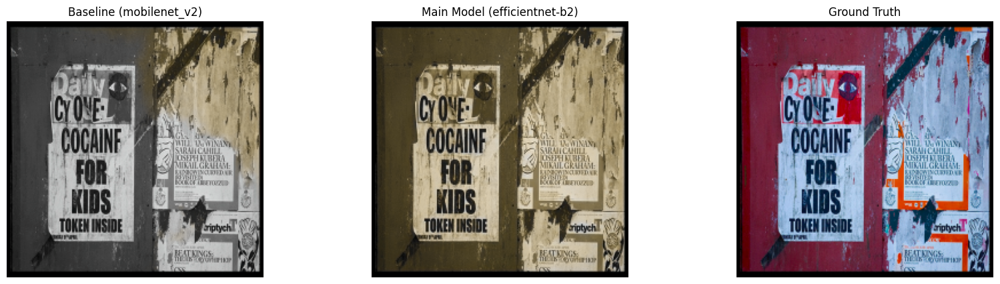

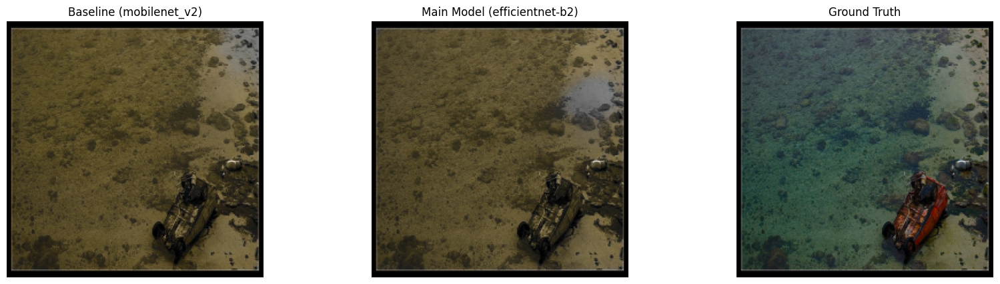

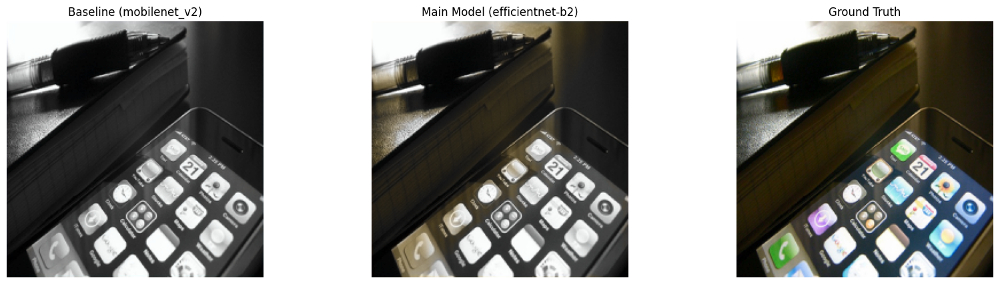

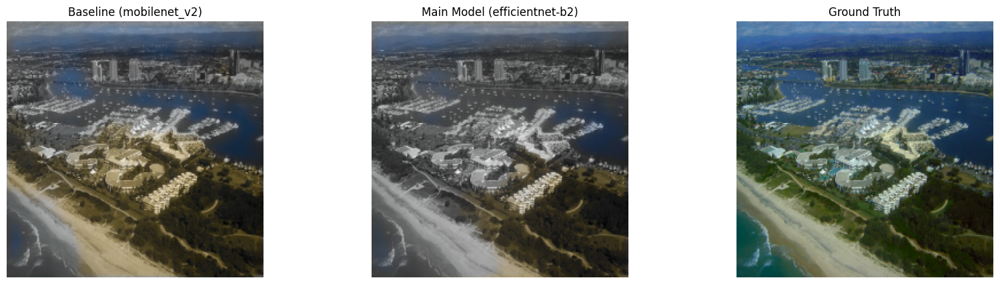

In [134]:
baseline_model = smp.Unet(
    BASELINE_MODEL_NAME,
    encoder_weights=None,
    in_channels=3,
    classes=2
)
main_model = smp.Unet(
    MAIN_MODEL_NAME,
    encoder_weights=None,
    in_channels=3,
    classes=2
)

baseline_model.load_state_dict(torch.load(BASELINE_WEIGHTS_PATH))
main_model.load_state_dict(torch.load(MAIN_WEIGHTS_PATH))

# create a shuffled test loader to use only for visualization
num_images = 20
temp_test_loader = DataLoader(test_dataset, batch_size=num_images, shuffle=True)

visualize_results(
    model_baseline=baseline_model,
    model_main=main_model,
    loader=temp_test_loader,
    device=device,
    num_images=num_images
)

In [65]:
def evaluate_model_on_test_set(model, test_loader, device):
    model.to(device)
    model.eval()

    total_psnr = 0.0
    total_ssim = 0.0
    count = 0

    with torch.no_grad():
        for L_batch, ab_batch in tqdm(test_loader, desc="Evaluating on Test Set"):
            L_batch = L_batch.to(device)
            predicted_ab = model(L_batch).cpu()

            for i in range(L_batch.size(0)):
                L_single_channel = L_batch[i, 0:1, :, :]
                # denormalize == (L * std) + mean
                mean_0 = 0.485
                std_0 = 0.229
                gt_L = (((L_single_channel.cpu().permute(1, 2, 0) * std_0) + mean_0) * 255.0).numpy().astype(np.uint8)
                gt_ab = ((ab_batch[i].numpy().transpose(1, 2, 0) * 128.0) + 128.0).astype(np.uint8)
                gt_Lab = np.concatenate((gt_L, gt_ab), axis=2)
                gt_rgb = cv2.cvtColor(gt_Lab, cv2.COLOR_Lab2RGB)

                pred_ab = ((predicted_ab[i].numpy().transpose(1, 2, 0) * 128.0) + 128.0).astype(np.uint8)
                pred_Lab = np.concatenate((gt_L, pred_ab), axis=2)
                pred_rgb = cv2.cvtColor(pred_Lab, cv2.COLOR_Lab2RGB)

                total_psnr += psnr(gt_rgb, pred_rgb, data_range=255)
                total_ssim += ssim(gt_rgb, pred_rgb, channel_axis=2, data_range=255)
                count += 1

    avg_psnr = total_psnr / count
    avg_ssim = total_ssim / count

    return avg_psnr, avg_ssim

In [66]:
baseline_avg_psnr, baseline_avg_ssim = evaluate_model_on_test_set(
    model=baseline_model,
    test_loader=test_loader,
    device=device
)

Evaluating on Test Set: 100%|██████████| 79/79 [01:14<00:00,  1.07it/s]


In [67]:
main_avg_psnr, main_avg_ssim = evaluate_model_on_test_set(
    model=main_model,
    test_loader=test_loader,
    device=device
)

Evaluating on Test Set: 100%|██████████| 79/79 [01:16<00:00,  1.03it/s]


In [68]:
print(f"{baseline_avg_psnr=:.5f}")
print(f"{baseline_avg_ssim=:.5f}")

baseline_avg_psnr=23.15537
baseline_avg_ssim=0.87733


In [69]:
print(f"{main_avg_psnr=:.5f}")
print(f"{main_avg_ssim=:.5f}")

main_avg_psnr=23.19728
main_avg_ssim=0.88139


In [70]:
print(f"PSNR increase: {((main_avg_psnr/baseline_avg_psnr)-1)*100:.2f}%")
print(f"SSIM increase: {((main_avg_ssim/baseline_avg_ssim)-1)*100:.2f}%")

PSNR increase: 0.18%
SSIM increase: 0.46%
